## Setup

In [2]:
import requests
import geopandas as gpd
import pandas as pd
import os
import urllib
from matplotlib import pyplot as plt
import fiona
import zipfile
import owslib
import contextily as ctx
import seaborn as sns
import folium
import rasterio as rio

from rasterio import MemoryFile
from rasterio.plot import show
import json 
import osmnx  as ox
from shapely.geometry import Point, LineString

import pyrosm
from pyrosm.data import sources
import matplotlib.pyplot as plt
import warnings
from shapely.errors import ShapelyDeprecationWarning
warnings.filterwarnings("ignore", category=ShapelyDeprecationWarning)

## Brescia

Let's create a map with all the municipalities of the province of Brescia.


In [3]:
#download the file
url2022 = 'https://github.com/napo/geospatial_course_unitn/raw/master/data/istat/istat_administrative_units_2022.gpkg'
istat2022 = "istat_administrative_units_2022.gpkg"

r = requests.get(url2022, allow_redirects=True)
open(istat2022, 'wb').write(r.content)

116932608

In [4]:
fiona.listlayers(istat2022)

['provincies', 'regions', 'municipalities', 'macroregions']

In [5]:
#select all the provinces of italy
provincies_italy = gpd.read_file(istat2022,layer="provincies")
provincies_italy.head(3)

,COD_RIP,COD_REG,COD_PROV,COD_CM,COD_UTS,DEN_PROV,DEN_CM,DEN_UTS,SIGLA,TIPO_UTS,SHAPE_AREA,Shape_Leng,geometry
0,1,1,1,201,201,-,Torino,Torino,TO,Citta metropolitana,6.826908e+09,593389.667001,"MULTIPOLYGON (((411015.006 5049970.983, 411070..."
1,1,1,2,0,2,Vercelli,-,Vercelli,VC,Provincia,2.081602e+09,458754.449021,"MULTIPOLYGON (((437900.552 5088796.204, 437915..."
2,1,1,3,0,3,Novara,-,Novara,NO,Provincia,1.340250e+09,276722.284585,"MULTIPOLYGON (((459146.367 5079451.275, 459180..."


In [6]:
#find all the provinces in italy
provincies_italy.DEN_PROV.unique()

array(['-', 'Vercelli', 'Novara', 'Cuneo', 'Asti', 'Alessandria', 'Aosta',
       'Imperia', 'Savona', 'La Spezia', 'Varese', 'Como', 'Sondrio',
       'Bergamo', 'Brescia', 'Pavia', 'Cremona', 'Mantova', 'Bolzano',
       'Trento', 'Verona', 'Vicenza', 'Belluno', 'Treviso', 'Padova',
       'Rovigo', 'Udine', 'Gorizia', 'Trieste', 'Piacenza', 'Parma',
       "Reggio nell'Emilia", 'Modena', 'Ferrara', 'Ravenna',
       "Forli'-Cesena", 'Pesaro e Urbino', 'Ancona', 'Macerata',
       'Ascoli Piceno', 'Massa Carrara', 'Lucca', 'Pistoia', 'Livorno',
       'Pisa', 'Arezzo', 'Siena', 'Grosseto', 'Perugia', 'Terni',
       'Viterbo', 'Rieti', 'Latina', 'Frosinone', 'Caserta', 'Benevento',
       'Avellino', 'Salerno', "L'Aquila", 'Teramo', 'Pescara', 'Chieti',
       'Campobasso', 'Foggia', 'Taranto', 'Brindisi', 'Lecce', 'Potenza',
       'Matera', 'Cosenza', 'Catanzaro', 'Trapani', 'Agrigento',
       'Caltanissetta', 'Enna', 'Ragusa', 'Siracusa', 'Sassari', 'Nuoro',
       'Pordenone', '

In [7]:
#identify the province of Brescia
brescia_province = provincies_italy[provincies_italy['DEN_PROV']=='Brescia']
brescia_province
#so the code of Brescia is 17 (COD_PROV = 17)

,COD_RIP,COD_REG,COD_PROV,COD_CM,COD_UTS,DEN_PROV,DEN_CM,DEN_UTS,SIGLA,TIPO_UTS,SHAPE_AREA,Shape_Leng,geometry
16,1,3,17,0,17,Brescia,-,Brescia,BS,Provincia,4.785482e+09,488116.238259,"MULTIPOLYGON (((613174.863 5134504.559, 613226..."


In [8]:
#download all the municipalities of italy and have a look
municipalities_italy = gpd.read_file(istat2022,layer="municipalities")
municipalities_italy.head(3)

,COD_RIP,COD_REG,COD_PROV,COD_CM,COD_UTS,PRO_COM,PRO_COM_T,COMUNE,COMUNE_A,CC_UTS,Shape_Area,Shape_Leng,geometry
0,1,1,1,201,201,1077,001077,Chiaverano,None,0,1.202212e+07,18164.236621,"MULTIPOLYGON (((414358.390 5042001.044, 414381..."
1,1,1,1,201,201,1079,001079,Chiesanuova,None,0,4.118911e+06,10777.318814,"MULTIPOLYGON (((394621.039 5031581.116, 394716..."
2,1,1,1,201,201,1089,001089,Coazze,None,0,5.657268e+07,41591.122092,"MULTIPOLYGON (((364914.897 4993224.894, 364929..."


In [9]:
# select all the municipalities in the province of Brescia (COD_PROV == 17)
brescia_municipalities = municipalities_italy[municipalities_italy['COD_PROV']==17]
brescia_municipalities.shape

#there are 205 municipalities in Brescia

(205, 13)

In [10]:
brescia_municipalities.head(3)

,COD_RIP,COD_REG,COD_PROV,COD_CM,COD_UTS,PRO_COM,PRO_COM_T,COMUNE,COMUNE_A,CC_UTS,Shape_Area,Shape_Leng,geometry
425,1,3,17,0,17,17118,017118,Niardo,None,0,2.215744e+07,22645.693791,"MULTIPOLYGON (((603433.098 5093049.164, 603475..."
428,1,3,17,0,17,17143,017143,Pisogne,None,0,4.922732e+07,35264.149969,"MULTIPOLYGON (((588168.205 5076151.290, 588186..."
685,1,3,17,0,17,17049,017049,Cerveno,None,0,2.155247e+07,36136.417686,"MULTIPOLYGON (((596958.147 5100661.110, 596998..."


In [11]:
brescia_municipalities.explore()

In [12]:
brescia_municipalities.crs

<Derived Projected CRS: EPSG:32632>
Name: WGS 84 / UTM zone 32N
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Between 6°E and 12°E, northern hemisphere between equator and 84°N, onshore and offshore. Algeria. Austria. Cameroon. Denmark. Equatorial Guinea. France. Gabon. Germany. Italy. Libya. Liechtenstein. Monaco. Netherlands. Niger. Nigeria. Norway. Sao Tome and Principe. Svalbard. Sweden. Switzerland. Tunisia. Vatican City State.
- bounds: (6.0, 0.0, 12.0, 84.0)
Coordinate Operation:
- name: UTM zone 32N
- method: Transverse Mercator
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

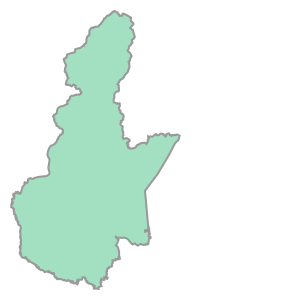

In [13]:
boundary_province_of_brescia = brescia_province.geometry.values[0]
boundary_province_of_brescia

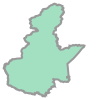

In [14]:
# here we can see the boundary of province of Brescia in epgs=4326 
boundary_province_of_brescia_epgs4326 = brescia_province.to_crs(epsg=4326).geometry.values[0]
boundary_province_of_brescia_epgs4326

In [15]:
# we indentify the biggest municipality and the smallest municipality in the province of Brescia
biggest_municipality_brescia =  brescia_municipalities[brescia_municipalities.geometry.area == brescia_municipalities.geometry.area.max()]
smallest_municipality_brescia = brescia_municipalities[brescia_municipalities.geometry.area == brescia_municipalities.geometry.area.min()]

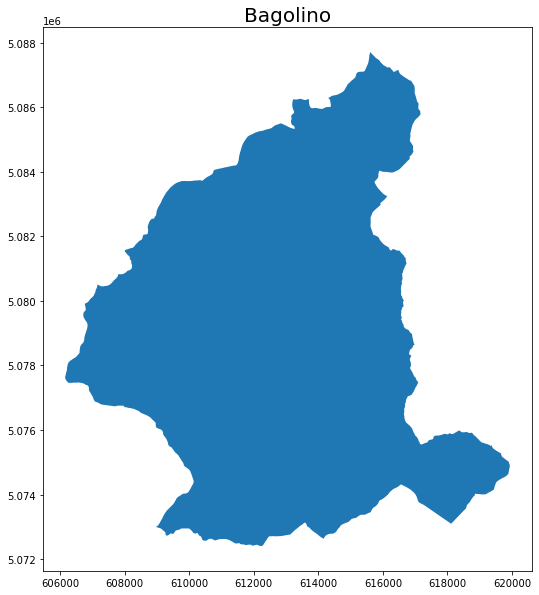

In [16]:
#biggest municipality
biggest_municipality_brescia.plot(figsize=(10,10))
plt.title(list(biggest_municipality_brescia.COMUNE)[0], fontsize = 20)
plt.show()

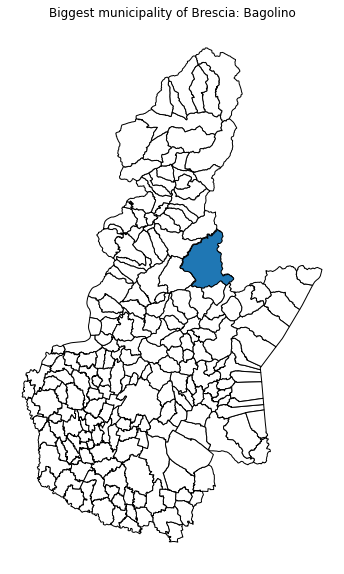

In [17]:
#let's see where it is
ax = brescia_municipalities.plot(edgecolor='k',  figsize=(10,10), color ='white')
biggest_municipality_brescia.plot(ax = ax, edgecolor='k')
plt.title(f"Biggest municipality of Brescia: {list(biggest_municipality_brescia.COMUNE)[0]}")
ax.set_axis_off()
plt.show()


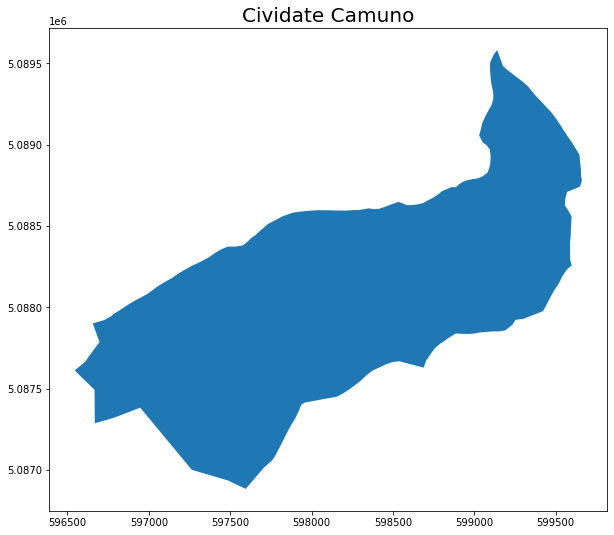

In [18]:
#smallest municipality
smallest_municipality_brescia.plot(figsize=(10,10))
plt.title(list(smallest_municipality_brescia.COMUNE)[0], fontsize = 20)
plt.show()

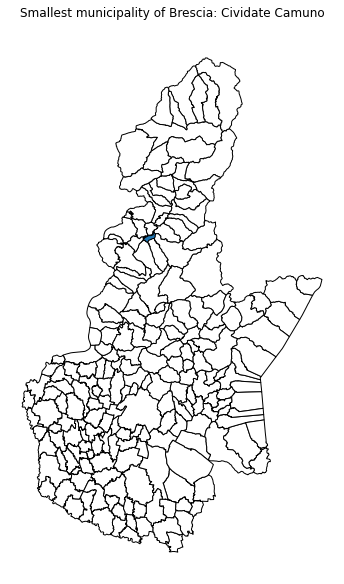

In [19]:
#let's see where it is
ax = brescia_municipalities.plot(edgecolor='k',  figsize=(10,10), color ='white')
smallest_municipality_brescia.plot(ax = ax, edgecolor='k')
plt.title(f"Smallest municipality of Brescia: {list(smallest_municipality_brescia.COMUNE)[0]}")
ax.set_axis_off()
plt.show()

## Pollution in Brescia
We want to investigate the level of pollution in the province of Brescia. 
Which is the most polluted municipality of Brescia? Is the level of pollution constant throughout the year, or is there one month with a higher level of pollution than the others?  
Firstly, we can try to better understand how the air quality is measured, from https://www.dati.lombardia.it/Ambiente/Mappa-stazioni-qualit-dell-aria/npva-smv6 we get the data:

In [20]:
air_quality_stations = pd.read_csv("https://github.com/elisa-mcc/Geospatial/raw/main/data/Mappa_stazioni_qualit__dell_aria.csv")

In [21]:
air_quality_stations.head()

,IdSensore,NomeTipoSensore,UnitaMisura,Idstazione,NomeStazione,Quota,Provincia,Comune,Storico,DataStart,DataStop,Utm_Nord,UTM_Est,lat,lng,location
0,10431,Ossidi di Azoto,µg/m³,1264,Sondrio v.Paribelli,290.0,SO,Sondrio,N,11/11/2008,NaN,5113073,567873,46.167852,9.879210,"(46.167852440665115, 9.879209924469903)"
1,9968,Ossidi di Azoto,µg/m³,679,Valmadrera v.Pozzi,247.0,LC,Valmadrera,N,16/02/2006,NaN,5076576,527307,45.842207,9.351658,"(45.842207261022544, 9.351658166127958)"
2,5543,Biossido di Azoto,µg/m³,540,Garbagnate Milanese v. Villoresi,175.0,MI,Garbagnate Milanese,S,11/12/1992,30/07/2018,5046467,506105,45.571716,9.078242,"(45.5717162655023, 9.07824159056828)"
3,20197,PM10 (SM2005),µg/m³,598,San Rocco al Porto v.Matteotti,50.0,LO,San Rocco al Porto,N,01/01/2002,NaN,4992297,555154,45.081987,9.700788,"(45.081986696978625, 9.70078817718398)"
4,5611,Biossido di Azoto,µg/m³,608,Codogno v.Trento,59.0,LO,Codogno,N,13/01/2000,NaN,5000892,554872,45.159373,9.698148,"(45.15937280234111, 9.69814824935254)"


In [22]:
#create the geodataframe in order to see where the stations are located
geo_air_quality_stations = gpd.GeoDataFrame(
    air_quality_stations,
    crs='EPSG:4326',
    geometry=gpd.points_from_xy(air_quality_stations.lng, air_quality_stations.lat))

In [23]:
# select only points within province of Brescia
bs_air_quality_stations = geo_air_quality_stations[geo_air_quality_stations.within(boundary_province_of_brescia_epgs4326)]

In [24]:
bs_air_quality_stations.head(3)

,IdSensore,NomeTipoSensore,UnitaMisura,Idstazione,NomeStazione,Quota,Provincia,Comune,Storico,DataStart,DataStop,Utm_Nord,UTM_Est,lat,lng,location,geometry
28,6840,Ossidi di Azoto,µg/m³,658,Manerbio v.Solferino,66.0,BS,Manerbio,S,28/08/1992,03/03/2015,5022465,589673,45.349959,10.144752,"(45.34995949312804, 10.144752235947312)",POINT (10.14475 45.34996)
43,20497,Benzene,µg/m³,1801,Brescia v.Tartaglia,151.0,BS,Brescia,N,NaN,NaN,5043948,594556,45.542648,10.211205,"(45.542647891822845, 10.211205215118259)",POINT (10.21121 45.54265)
69,6953,PM10 (SM2005),µg/m³,659,Odolo v.Praes,349.0,BS,Odolo,N,23/06/2000,NaN,5055661,608260,45.646050,10.389295,"(45.64604963372525, 10.38929530279196)",POINT (10.38930 45.64605)


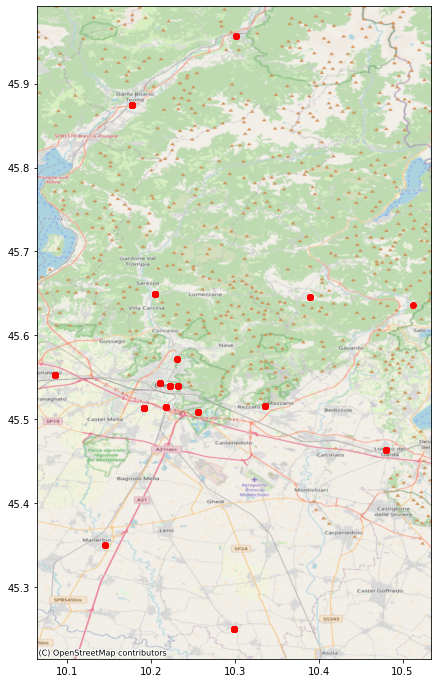

In [25]:
# we can all the stations and the background maps
ax = bs_air_quality_stations.plot(color = 'red', figsize=(12,12))
ctx.add_basemap(ax, crs=geo_air_quality_stations.crs.to_string(),
                source=ctx.providers.OpenStreetMap.Mapnik)


In [26]:
# we can see that there are different types of sensors
bs_air_quality_stations.NomeTipoSensore.unique()

array(['Ossidi di Azoto', 'Benzene', 'PM10 (SM2005)', 'Biossido di Azoto',
       'Cadmio', 'Monossido di Carbonio', 'Particolato Totale Sospeso',
       'Piombo', 'Biossido di Zolfo', 'Particelle sospese PM2.5',
       'Monossido di Azoto', 'Ozono', 'Arsenico', 'Benzo(a)pirene',
       'Nikel'], dtype=object)

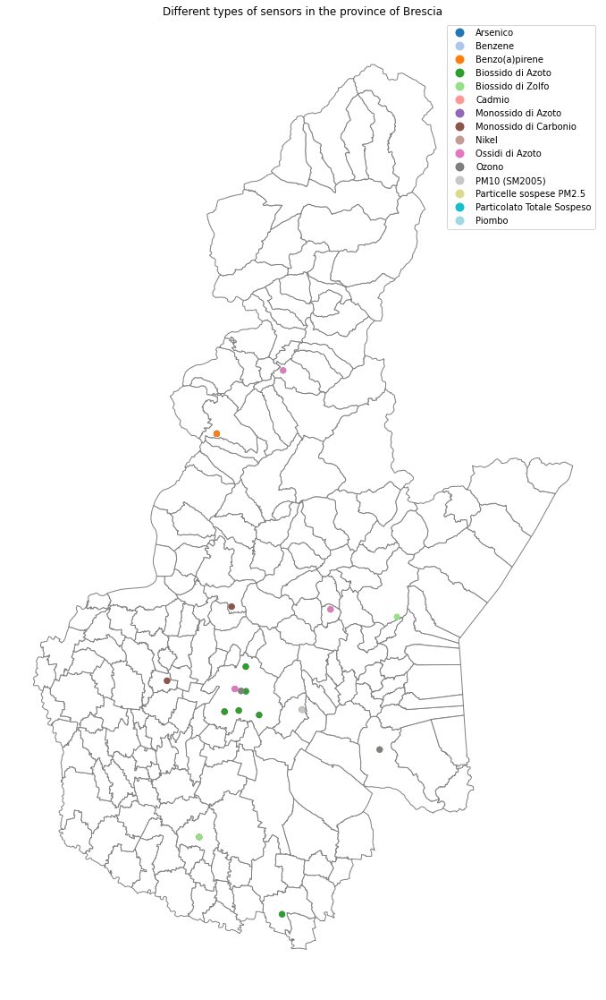

In [27]:
#since it seems that there are overlapping we can plot each type of sensor in a differnt color
ax = brescia_municipalities.to_crs(epsg=4326).plot(edgecolor='gray',  figsize=(20,20), color ='white')
bs_air_quality_stations.plot(ax = ax, column = "NomeTipoSensore", legend=True, cmap ='tab20')
ax.set_axis_off()
ax.set_title("Different types of sensors in the province of Brescia")
plt.show()
# I suppose that there are still overlapping, this is not a clear representation

Since there are many sensors, in this project we will focus our attention on PM10 and PM2.5

In [28]:
# select sensors of pm10 
bs_stations_pm10 = bs_air_quality_stations[bs_air_quality_stations['NomeTipoSensore']== 'PM10 (SM2005)' ]
bs_stations_pm10

,IdSensore,NomeTipoSensore,UnitaMisura,Idstazione,NomeStazione,Quota,Provincia,Comune,Storico,DataStart,DataStop,Utm_Nord,UTM_Est,lat,lng,location,geometry
69,6953,PM10 (SM2005),µg/m³,659,Odolo v.Praes,349.0,BS,Odolo,N,23/06/2000,NaN,5055661,608260,45.646050,10.389295,"(45.64604963372525, 10.38929530279196)",POINT (10.38930 45.64605)
310,6952,PM10 (SM2005),µg/m³,654,Sarezzo v.Minelli,269.0,BS,Sarezzo,N,23/06/2000,NaN,5055826,593900,45.649627,10.205090,"(45.64962671224069, 10.205090218837002)",POINT (10.20509 45.64963)
325,20496,PM10 (SM2005),µg/m³,1801,Brescia v.Tartaglia,151.0,BS,Brescia,N,NaN,NaN,5043948,594556,45.542648,10.211205,"(45.542647891822845, 10.211205215118259)",POINT (10.21121 45.54265)
676,9961,PM10 (SM2005),µg/m³,669,Brescia Villaggio Sereno,70.0,BS,Brescia,N,01/01/2006,NaN,5040636,593101,45.513039,10.191942,"(45.513038818653754, 10.19194188877931)",POINT (10.19194 45.51304)
707,10501,PM10 (SM2005),µg/m³,655,Darfo Boario Terme v. De Amicis,221.0,BS,Darfo Boario Terme,N,23/12/2008,NaN,5080789,591371,45.874602,10.177357,"(45.87460210989037, 10.17735680898138)",POINT (10.17736 45.87460)
814,6951,PM10 (SM2005),µg/m³,649,Brescia v.Broletto,149.0,BS,Brescia,N,23/09/2000,NaN,5043674,595467,45.540058,10.222818,"(45.540057846971386, 10.222818449274216)",POINT (10.22282 45.54006)
928,6954,PM10 (SM2005),µg/m³,661,Rezzato v.De Gasperi,147.0,BS,Rezzato,N,27/01/1997,NaN,5041110,604367,45.515708,10.336240,"(45.51570829484459, 10.336240422996532)",POINT (10.33624 45.51571)


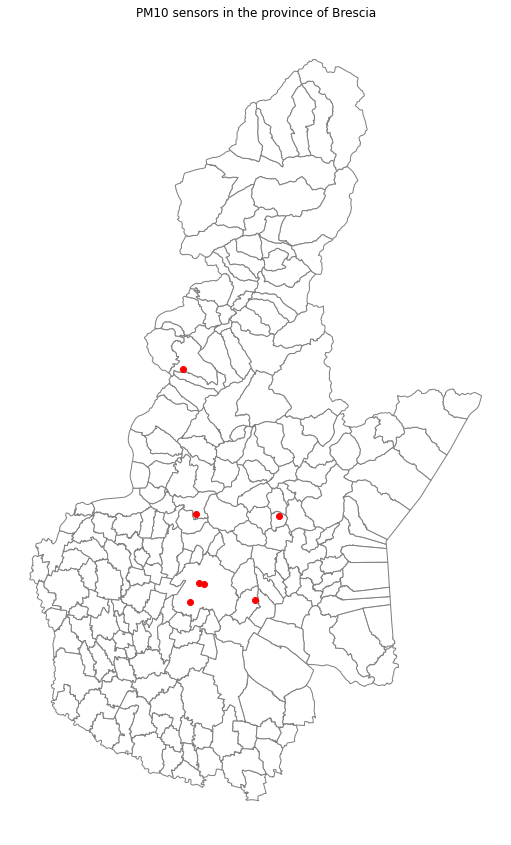

In [29]:
ax = brescia_municipalities.to_crs(epsg=4326).plot(edgecolor='gray',  figsize=(15,15), color ='white')
bs_stations_pm10.plot(ax = ax, color = 'red')
ax.set_axis_off()
ax.set_title("PM10 sensors in the province of Brescia")
plt.show()


In [30]:
# select sensors of pm2.5
bs_stations_pm25 = bs_air_quality_stations[bs_air_quality_stations['NomeTipoSensore']== 'Particelle sospese PM2.5' ]
bs_stations_pm25

,IdSensore,NomeTipoSensore,UnitaMisura,Idstazione,NomeStazione,Quota,Provincia,Comune,Storico,DataStart,DataStop,Utm_Nord,UTM_Est,lat,lng,location,geometry
299,20492,Particelle sospese PM2.5,µg/m³,1800,Brescia S.Polo,124.0,BS,Brescia,N,NaN,NaN,5040227,598141,45.508667,10.256370,"(45.5086667998462, 10.256370247433845)",POINT (10.25637 45.50867)
409,9984,Particelle sospese PM2.5,µg/m³,669,Brescia Villaggio Sereno,70.0,BS,Brescia,N,06/06/2006,NaN,5040636,593101,45.513039,10.191942,"(45.513038818653754, 10.19194188877931)",POINT (10.19194 45.51304)
486,10450,Particelle sospese PM2.5,µg/m³,655,Darfo Boario Terme v. De Amicis,221.0,BS,Darfo Boario Terme,N,23/12/2008,NaN,5080789,591371,45.874602,10.177357,"(45.87460210989037, 10.17735680898138)",POINT (10.17736 45.87460)
837,30158,Particelle sospese PM2.5,µg/m³,649,Brescia v.Broletto,149.0,BS,Brescia,N,13/12/2013,NaN,5043674,595467,45.540058,10.222818,"(45.540057846971386, 10.222818449274216)",POINT (10.22282 45.54006)


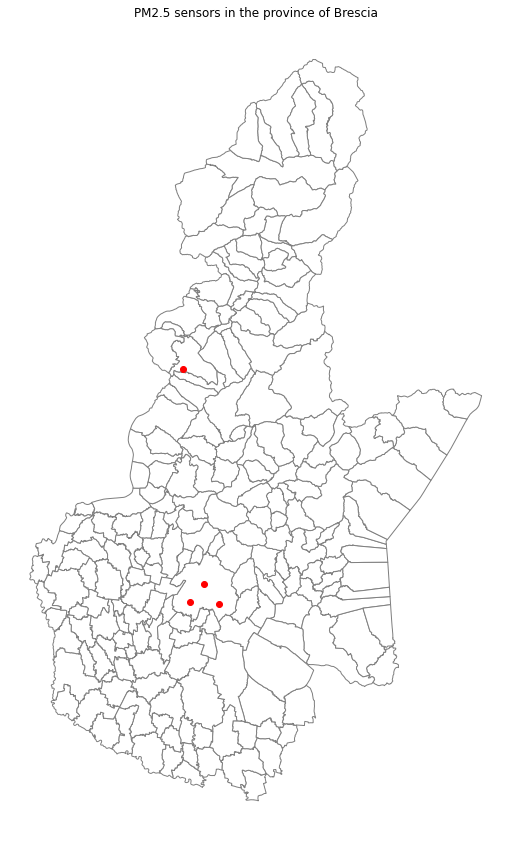

In [31]:
ax = brescia_municipalities.to_crs(epsg=4326).plot(edgecolor='gray',  figsize=(15,15), color ='white')
bs_stations_pm25.plot(ax = ax, color = 'red')
ax.set_axis_off()
ax.set_title("PM2.5 sensors in the province of Brescia")
plt.show()

We can notice that there are few sensors and we want to know the air quality of each municipality in Brescia in order to understand which one is most polluted. For this reason we use the estimation of monthly pm10 and pm2.5 level in each municipality.  
These data are collected from [ARPA Lombardia]("https://www.arpalombardia.it/Pages/Aria/Richiesta-Dati.aspx"), in the file data_manipulation.R there is the script used to create the following datasets.


In [32]:
# level of pm10 and pm2.5 on average in each municipality of Brescia
brescia_pm10 = pd.read_csv("https://github.com/elisa-mcc/Geospatial/raw/main/data/pm10_comuni_brescia_2020.csv", index_col=0)
brescia_pm25 = pd.read_csv("https://github.com/elisa-mcc/Geospatial/raw/main/data/pm2.5_comuni_brescia_2020.csv", index_col=0)

In [33]:
brescia_pm10.head(3)

,Month,PM10...µg.m.,COMUNE,Year
1,agosto,19.548387,Acquafredda,2020
2,aprile,18.866667,Acquafredda,2020
3,dicembre,28.000000,Acquafredda,2020


In [34]:
brescia_pm25.head(3)

,Month,Particelle.sospese.PM2.5...µg.m.,COMUNE,Year
1,agosto,11.806452,Acquafredda,2020
2,aprile,16.933333,Acquafredda,2020
3,dicembre,28.903226,Acquafredda,2020


In [35]:
#join these two datasets
brescia_pm10_pm25 = pd.merge(brescia_pm25, brescia_pm10)

#reoder columns
brescia_pm10_pm25 = brescia_pm10_pm25[["Month", "PM10...µg.m.", "Particelle.sospese.PM2.5...µg.m.", "COMUNE", "Year"]]
brescia_pm10_pm25

,Month,PM10...µg.m.,Particelle.sospese.PM2.5...µg.m.,COMUNE,Year
0,agosto,19.548387,11.806452,Acquafredda,2020
1,aprile,18.866667,16.933333,Acquafredda,2020
2,dicembre,28.000000,28.903226,Acquafredda,2020
3,febbraio,25.413793,22.689655,Acquafredda,2020
4,gennaio,34.258065,30.903226,Acquafredda,2020
...,...,...,...,...,...
2443,maggio,11.870968,8.290323,Zone,2020
2444,marzo,19.645161,15.419355,Zone,2020
2445,novembre,21.833333,17.300000,Zone,2020
2446,ottobre,6.677419,8.677419,Zone,2020


In [36]:
#we merge the two datasets and we obtain the estimation of monthly pm10 level for each municipality
geo_brescia_pm = pd.merge(brescia_municipalities, brescia_pm10_pm25 , on = 'COMUNE')
geo_brescia_pm.head(3)

,COD_RIP,COD_REG,COD_PROV,COD_CM,COD_UTS,PRO_COM,PRO_COM_T,COMUNE,COMUNE_A,CC_UTS,Shape_Area,Shape_Leng,geometry,Month,PM10...µg.m.,Particelle.sospese.PM2.5...µg.m.,Year
0,1,3,17,0,17,17118,017118,Niardo,None,0,2.215744e+07,22645.693791,"MULTIPOLYGON (((603433.098 5093049.164, 603475...",agosto,4.225806,4.322581,2020
1,1,3,17,0,17,17118,017118,Niardo,None,0,2.215744e+07,22645.693791,"MULTIPOLYGON (((603433.098 5093049.164, 603475...",aprile,10.466667,9.500000,2020
2,1,3,17,0,17,17118,017118,Niardo,None,0,2.215744e+07,22645.693791,"MULTIPOLYGON (((603433.098 5093049.164, 603475...",dicembre,13.000000,6.806452,2020


In [37]:
# here we can see the first 20 municipalities with the highest value of pm10 during the 2020
geo_brescia_pm.nlargest(n = 20, columns=["PM10...µg.m."])
# we can notice that the level of pm10 is higher during november and january

,COD_RIP,COD_REG,COD_PROV,COD_CM,COD_UTS,PRO_COM,PRO_COM_T,COMUNE,COMUNE_A,CC_UTS,Shape_Area,Shape_Leng,geometry,Month,PM10...µg.m.,Particelle.sospese.PM2.5...µg.m.,Year
1396,1,3,17,0,17,17055,017055,Cividate Camuno,None,0,3.306762e+06,9616.908354,"MULTIPOLYGON (((599650.124 5088743.196, 599626...",gennaio,65.419355,60.161290,2020
1816,1,3,17,0,17,17173,017173,San Zeno Naviglio,None,0,6.253107e+06,14600.224229,"MULTIPOLYGON (((595445.697 5039503.811, 595420...",gennaio,58.129032,46.935484,2020
2416,1,3,17,0,17,17165,017165,Roncadelle,None,0,9.389876e+06,18717.723910,"MULTIPOLYGON (((588652.195 5044712.522, 588803...",gennaio,57.225806,47.709677,2020
1048,1,3,17,0,17,17072,017072,Flero,None,0,9.836693e+06,16231.349197,"MULTIPOLYGON (((591087.176 5038752.567, 591131...",gennaio,57.032258,47.387097,2020
1444,1,3,17,0,17,17042,017042,Castel Mella,None,0,7.528504e+06,14529.254203,"MULTIPOLYGON (((590054.019 5041761.603, 590071...",gennaio,56.709677,47.677419,2020
2152,1,3,17,0,17,17029,017029,Brescia,None,1,9.033374e+07,57704.195366,"MULTIPOLYGON (((596373.877 5048872.468, 596334...",gennaio,55.709677,43.838710,2020
1984,1,3,17,0,17,17021,017021,Borgosatollo,None,0,8.419856e+06,15794.857880,"MULTIPOLYGON (((597055.132 5039415.559, 597098...",gennaio,55.580645,45.322581,2020
1557,1,3,17,0,17,17043,017043,Castenedolo,None,0,2.619505e+07,27446.193132,"MULTIPOLYGON (((599512.427 5038421.567, 599598...",novembre,55.533333,37.800000,2020
741,1,3,17,0,17,17107,017107,Mazzano,None,0,1.572651e+07,20896.174592,"MULTIPOLYGON (((606136.695 5041904.544, 606156...",novembre,55.466667,35.333333,2020
1989,1,3,17,0,17,17021,017021,Borgosatollo,None,0,8.419856e+06,15794.857880,"MULTIPOLYGON (((597055.132 5039415.559, 597098...",novembre,55.066667,40.233333,2020


Municipalities with the highest values of PM10 are Cividate Camuno, San Zeno Naviglio, Roncadelle, Flero and Castel Mella

In [38]:
# here we can see the first 20 municipalities with the lowest value of pm10 during the 2020
geo_brescia_pm.nsmallest(n = 20, columns=["PM10...µg.m."])
# we can notice that the level of pm10 is lower from july to october 

,COD_RIP,COD_REG,COD_PROV,COD_CM,COD_UTS,PRO_COM,PRO_COM_T,COMUNE,COMUNE_A,CC_UTS,Shape_Area,Shape_Leng,geometry,Month,PM10...µg.m.,Particelle.sospese.PM2.5...µg.m.,Year
574,1,3,17,0,17,17175,017175,Saviore dell'Adamello,None,0,8.426771e+07,48484.115479,"MULTIPOLYGON (((619130.259 5116031.982, 619336...",ottobre,2.451613,2.451613,2020
1150,1,3,17,0,17,17148,017148,Ponte di Legno,None,0,1.004260e+08,61804.453036,"MULTIPOLYGON (((613174.863 5134504.559, 613226...",ottobre,2.666667,3.100000,2020
706,1,3,17,0,17,17184,017184,Temù,None,0,4.325699e+07,42727.123427,"MULTIPOLYGON (((612262.044 5130774.887, 612314...",ottobre,2.766667,7.709677,2020
564,1,3,17,0,17,17175,017175,Saviore dell'Adamello,None,0,8.426771e+07,48484.115479,"MULTIPOLYGON (((619130.259 5116031.982, 619336...",agosto,2.870968,2.903226,2020
2266,1,3,17,0,17,17202,017202,Vione,None,0,3.526491e+07,33991.592663,"MULTIPOLYGON (((611775.123 5128878.703, 611791...",ottobre,2.900000,4.551724,2020
322,1,3,17,0,17,17198,017198,Vezza d'Oglio,None,0,5.414720e+07,43174.292267,"MULTIPOLYGON (((610258.070 5132426.971, 610259...",ottobre,2.933333,4.413793,2020
1140,1,3,17,0,17,17148,017148,Ponte di Legno,None,0,1.004260e+08,61804.453036,"MULTIPOLYGON (((613174.863 5134504.559, 613226...",agosto,2.935484,3.233333,2020
570,1,3,17,0,17,17175,017175,Saviore dell'Adamello,None,0,8.426771e+07,48484.115479,"MULTIPOLYGON (((619130.259 5116031.982, 619336...",luglio,2.966667,2.933333,2020
58,1,3,17,0,17,17063,017063,Corteno Golgi,None,0,8.260458e+07,42192.928623,"MULTIPOLYGON (((595307.163 5116056.999, 595348...",ottobre,3.000000,4.064516,2020
696,1,3,17,0,17,17184,017184,Temù,None,0,4.325699e+07,42727.123427,"MULTIPOLYGON (((612262.044 5130774.887, 612314...",agosto,3.129032,5.677419,2020


In [39]:
# here we can see the first 20 municipalities with the highest value of pm2.5 during the 2020
geo_brescia_pm.nlargest(n = 20, columns=["Particelle.sospese.PM2.5...µg.m."])
# we can see that the month with the highest value of pm2.5 is january

,COD_RIP,COD_REG,COD_PROV,COD_CM,COD_UTS,PRO_COM,PRO_COM_T,COMUNE,COMUNE_A,CC_UTS,Shape_Area,Shape_Leng,geometry,Month,PM10...µg.m.,Particelle.sospese.PM2.5...µg.m.,Year
1396,1,3,17,0,17,17055,017055,Cividate Camuno,None,0,3.306762e+06,9616.908354,"MULTIPOLYGON (((599650.124 5088743.196, 599626...",gennaio,65.419355,60.161290,2020
2416,1,3,17,0,17,17165,017165,Roncadelle,None,0,9.389876e+06,18717.723910,"MULTIPOLYGON (((588652.195 5044712.522, 588803...",gennaio,57.225806,47.709677,2020
1444,1,3,17,0,17,17042,017042,Castel Mella,None,0,7.528504e+06,14529.254203,"MULTIPOLYGON (((590054.019 5041761.603, 590071...",gennaio,56.709677,47.677419,2020
1048,1,3,17,0,17,17072,017072,Flero,None,0,9.836693e+06,16231.349197,"MULTIPOLYGON (((591087.176 5038752.567, 591131...",gennaio,57.032258,47.387097,2020
1816,1,3,17,0,17,17173,017173,San Zeno Naviglio,None,0,6.253107e+06,14600.224229,"MULTIPOLYGON (((595445.697 5039503.811, 595420...",gennaio,58.129032,46.935484,2020
2332,1,3,17,0,17,17147,017147,Poncarale,None,0,1.264322e+07,21203.903349,"MULTIPOLYGON (((594505.389 5036381.720, 594726...",gennaio,54.290323,45.967742,2020
1360,1,3,17,0,17,17040,017040,Castegnato,None,0,9.204837e+06,15548.692407,"MULTIPOLYGON (((586161.024 5046820.850, 586190...",gennaio,52.774194,45.451613,2020
1984,1,3,17,0,17,17021,017021,Borgosatollo,None,0,8.419856e+06,15794.857880,"MULTIPOLYGON (((597055.132 5039415.559, 597098...",gennaio,55.580645,45.322581,2020
724,1,3,17,0,17,17186,017186,Torbole Casaglia,None,0,1.343928e+07,21796.439294,"MULTIPOLYGON (((588591.195 5041950.542, 588648...",gennaio,53.129032,45.193548,2020
1395,1,3,17,0,17,17055,017055,Cividate Camuno,None,0,3.306762e+06,9616.908354,"MULTIPOLYGON (((599650.124 5088743.196, 599626...",febbraio,48.551724,44.482759,2020


Municipalities with the highest values of PM2.5 are Cividate Camuno, Roncadelle, Castel Mella, Flero and San Zeno Naviglio. We can notice that these are the same municipalities that appear for PM10.

In [40]:
geo_brescia_pm.nsmallest(n = 20, columns=["Particelle.sospese.PM2.5...µg.m."])

,COD_RIP,COD_REG,COD_PROV,COD_CM,COD_UTS,PRO_COM,PRO_COM_T,COMUNE,COMUNE_A,CC_UTS,Shape_Area,Shape_Leng,geometry,Month,PM10...µg.m.,Particelle.sospese.PM2.5...µg.m.,Year
574,1,3,17,0,17,17175,017175,Saviore dell'Adamello,None,0,8.426771e+07,48484.115479,"MULTIPOLYGON (((619130.259 5116031.982, 619336...",ottobre,2.451613,2.451613,2020
566,1,3,17,0,17,17175,017175,Saviore dell'Adamello,None,0,8.426771e+07,48484.115479,"MULTIPOLYGON (((619130.259 5116031.982, 619336...",dicembre,6.500000,2.724138,2020
564,1,3,17,0,17,17175,017175,Saviore dell'Adamello,None,0,8.426771e+07,48484.115479,"MULTIPOLYGON (((619130.259 5116031.982, 619336...",agosto,2.870968,2.903226,2020
570,1,3,17,0,17,17175,017175,Saviore dell'Adamello,None,0,8.426771e+07,48484.115479,"MULTIPOLYGON (((619130.259 5116031.982, 619336...",luglio,2.966667,2.933333,2020
1150,1,3,17,0,17,17148,017148,Ponte di Legno,None,0,1.004260e+08,61804.453036,"MULTIPOLYGON (((613174.863 5134504.559, 613226...",ottobre,2.666667,3.100000,2020
674,1,3,17,0,17,17058,017058,Collio,None,0,5.347490e+07,34648.769740,"MULTIPOLYGON (((604789.086 5080410.255, 604812...",dicembre,8.000000,3.225806,2020
1140,1,3,17,0,17,17148,017148,Ponte di Legno,None,0,1.004260e+08,61804.453036,"MULTIPOLYGON (((613174.863 5134504.559, 613226...",agosto,2.935484,3.233333,2020
1146,1,3,17,0,17,17148,017148,Ponte di Legno,None,0,1.004260e+08,61804.453036,"MULTIPOLYGON (((613174.863 5134504.559, 613226...",luglio,3.266667,3.266667,2020
567,1,3,17,0,17,17175,017175,Saviore dell'Adamello,None,0,8.426771e+07,48484.115479,"MULTIPOLYGON (((619130.259 5116031.982, 619336...",febbraio,3.862069,3.275862,2020
317,1,3,17,0,17,17198,017198,Vezza d'Oglio,None,0,5.414720e+07,43174.292267,"MULTIPOLYGON (((610258.070 5132426.971, 610259...",giugno,3.966667,3.300000,2020


We can notice that the level of PM10 and PM2.5 is not always the same throughout the year. In fact, it seems that air pollution is worse in November and January. Let's study with more attention these two months.

In [41]:
pm_jan = geo_brescia_pm[geo_brescia_pm['Month']== "gennaio"]
pm_jan.head(3)

,COD_RIP,COD_REG,COD_PROV,COD_CM,COD_UTS,PRO_COM,PRO_COM_T,COMUNE,COMUNE_A,CC_UTS,Shape_Area,Shape_Leng,geometry,Month,PM10...µg.m.,Particelle.sospese.PM2.5...µg.m.,Year
4,1,3,17,0,17,17118,017118,Niardo,None,0,2.215744e+07,22645.693791,"MULTIPOLYGON (((603433.098 5093049.164, 603475...",gennaio,17.806452,15.870968,2020
16,1,3,17,0,17,17143,017143,Pisogne,None,0,4.922732e+07,35264.149969,"MULTIPOLYGON (((588168.205 5076151.290, 588186...",gennaio,43.838710,36.903226,2020
28,1,3,17,0,17,17049,017049,Cerveno,None,0,2.155247e+07,36136.417686,"MULTIPOLYGON (((596958.147 5100661.110, 596998...",gennaio,16.419355,13.903226,2020


In [42]:
pm_nov = geo_brescia_pm[geo_brescia_pm['Month']== 'novembre']
pm_nov.head(3)

,COD_RIP,COD_REG,COD_PROV,COD_CM,COD_UTS,PRO_COM,PRO_COM_T,COMUNE,COMUNE_A,CC_UTS,Shape_Area,Shape_Leng,geometry,Month,PM10...µg.m.,Particelle.sospese.PM2.5...µg.m.,Year
9,1,3,17,0,17,17118,017118,Niardo,None,0,2.215744e+07,22645.693791,"MULTIPOLYGON (((603433.098 5093049.164, 603475...",novembre,15.366667,13.200000,2020
21,1,3,17,0,17,17143,017143,Pisogne,None,0,4.922732e+07,35264.149969,"MULTIPOLYGON (((588168.205 5076151.290, 588186...",novembre,22.466667,16.866667,2020
33,1,3,17,0,17,17049,017049,Cerveno,None,0,2.155247e+07,36136.417686,"MULTIPOLYGON (((596958.147 5100661.110, 596998...",novembre,17.833333,14.733333,2020


In [43]:
#visualize level of pm10 during january
pm_jan.explore(column = "PM10...µg.m.",cmap= "YlOrRd", control_scale=True, vmin = 0, vmax = 66)

In [44]:
#visualize pm10 during november
pm_nov.explore(column = "PM10...µg.m.",cmap= "YlOrRd", control_scale=True, vmin = 0, vmax = 66)

In [45]:
#visualize pm2.5 during janurary
pm_jan.explore(column = "Particelle.sospese.PM2.5...µg.m.",cmap= "YlOrRd", control_scale=True, vmin = 0, vmax = 61)

If we consider the pm10, we can see that during the month of January, the highest pm10 values are found in some municipalities; however, during the month of November, there are more municipalities with a high pm10 level (in fact, on the map you can see many more municipalities coloured red than in January).The red area shown in the map of November represents the Pianura Padana, which is one of the most polluted area in Italy.
Moreover, January is also the month with the highest values of pm2.5 and we can see that the highest values are again in the most southern part of the province.

I want to uderstand the situation in my municipality: in order to localize my municipality, I will try to use geocoding to convert a "famous" place near my house into geographic coordinates. Once this building is identified, I will use its position to better understand in which municipality we are.

In [46]:
# try to understand the situation in my municipality
# choose a point near my house, it is an important building (a museum)
q = 'Villa Mazzucchelli, Brescia, Italia'

In [47]:
point_nominatim = gpd.tools.geocode(q,provider="Nominatim",user_agent ="Mozilla/5.0 (Linux; Android10) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/86.0.4240.75 Mobile Safari/537.36")
point_nominatim

,geometry,address
0,POINT (10.34341 45.49356),"Villa Mazzucchelli, Viale Giacomo Matteotti, C..."


In [48]:
list(point_nominatim.address)
# We can notice that we are in Mazzano

['Villa Mazzucchelli, Viale Giacomo Matteotti, Ciliverghe, Mazzano, Brescia, Lombardia, 25086, Italia']

In [49]:
point_nominatim.explore(marker_kwds={"color": "green", "radius": "15"})

In order to show this building, I create a geotiff of Villa Mazzucchelli using QGIS.

In [50]:
import urllib.request
url_download_orthophoto_villamazzucchelli= 'https://github.com/elisa-mcc/Geospatial/raw/main/data/villamazzucchelli.tif'
file_villamazzucchelli = "villa_mazzucchelli.tif"
urllib.request.urlretrieve(url_download_orthophoto_villamazzucchelli ,file_villamazzucchelli) 

('villa_mazzucchelli.tif', <http.client.HTTPMessage at 0x237f3d06ef0>)

In [51]:
raster = rio.open(file_villamazzucchelli)

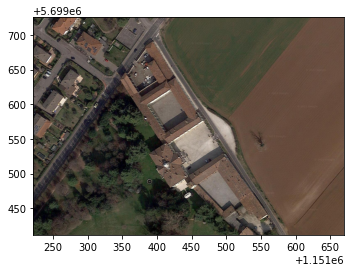

<AxesSubplot: >

In [52]:
from rasterio import MemoryFile
from rasterio.plot import show
show(raster)

In [53]:
raster.meta

{'driver': 'GTiff',
 'dtype': 'uint8',
 'nodata': None,
 'width': 1172,
 'height': 820,
 'count': 4,
 'crs': CRS.from_epsg(3857),
 'transform': Affine(0.3824041808874715, 0.0, 1151221.8427,
        0.0, -0.3824041808874715, 5699725.374614163)}

We clip the raster file based on polygon. We extract the polygon area of [Villa Mazzucchelli](https://overpass-turbo.eu/s/1pBK)


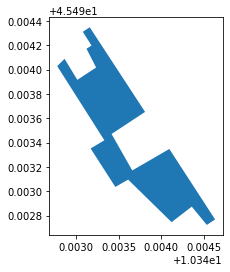

In [54]:
villa_mazzucchelli = gpd.read_file("https://github.com/elisa-mcc/Geospatial/raw/main/data/polygon_villamazzucchelli.geojson")
villa_mazzucchelli.plot()
plt.show()

In [55]:
def getFeatures(gdf):
    """Function to parse features from GeoDataFrame in such a manner that rasterio wants them"""
    return [json.loads(gdf.to_json())['features'][0]['geometry']]

In [56]:
coord = getFeatures(villa_mazzucchelli.to_crs(epsg=3857))

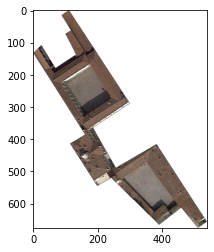

<AxesSubplot: >

In [57]:
from rasterio.mask import mask
out_img, out_transform = mask(raster, coord, crop=True)
out_meta = raster.meta
show(out_img)

# we can see clearly the boundaries of this building 

In [58]:
# We have found my municipality, that is Mazzano
# now try to understand the situation in my municipality
mazzano_pm10_pm25 = brescia_pm10_pm25[brescia_pm10_pm25['COMUNE']== 'Mazzano']

In [59]:
# worst level of pm10
mazzano_pm10_pm25[mazzano_pm10_pm25["PM10...µg.m."]== max(mazzano_pm10_pm25["PM10...µg.m."])]

,Month,PM10...µg.m.,Particelle.sospese.PM2.5...µg.m.,COMUNE,Year
1281,novembre,55.466667,35.333333,Mazzano,2020


In [60]:
# worst level of pm2.5
mazzano_pm10_pm25[mazzano_pm10_pm25["Particelle.sospese.PM2.5...µg.m."]== max(mazzano_pm10_pm25["Particelle.sospese.PM2.5...µg.m."])]

,Month,PM10...µg.m.,Particelle.sospese.PM2.5...µg.m.,COMUNE,Year
1276,gennaio,48.032258,37.322581,Mazzano,2020


In [61]:
#reoder months
mazzano_pm10_pm25 = mazzano_pm10_pm25.loc[[1276, 1275, 1280, 1273, 1279,  1277,1278, 1272, 1283, 1282, 1281, 1274]]
mazzano_pm10_pm25

,Month,PM10...µg.m.,Particelle.sospese.PM2.5...µg.m.,COMUNE,Year
1276,gennaio,48.032258,37.322581,Mazzano,2020
1275,febbraio,36.827586,26.448276,Mazzano,2020
1280,marzo,28.838710,21.064516,Mazzano,2020
1273,aprile,23.333333,17.400000,Mazzano,2020
1279,maggio,15.387097,10.548387,Mazzano,2020
1277,giugno,12.233333,8.666667,Mazzano,2020
1278,luglio,18.166667,10.133333,Mazzano,2020
1272,agosto,20.225806,10.548387,Mazzano,2020
1283,settembre,25.866667,11.800000,Mazzano,2020
1282,ottobre,31.935484,17.516129,Mazzano,2020


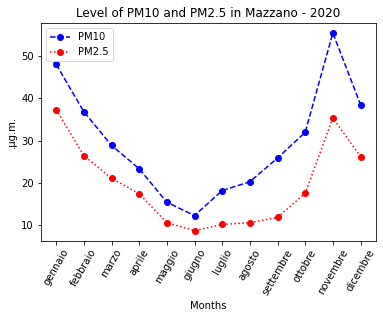

In [62]:
plt.plot(mazzano_pm10_pm25.Month , 
            mazzano_pm10_pm25['PM10...µg.m.'],
            linestyle='--', marker='o', color='b', label='PM10')
plt.plot(mazzano_pm10_pm25.Month , 
            mazzano_pm10_pm25['Particelle.sospese.PM2.5...µg.m.'],
            linestyle=':', marker='o', color='red', label='PM2.5')    
plt.legend()      
plt.xlabel("Months")
plt.ylabel(".µg.m.")
plt.xticks(rotation = 60)
plt.title("Level of PM10 and PM2.5 in Mazzano - 2020")
plt.show()

In [63]:
average_pm10 = mazzano_pm10_pm25["PM10...µg.m."].mean()
average_pm10

29.56780064268941

In [64]:
average_pm25 = mazzano_pm10_pm25["Particelle.sospese.PM2.5...µg.m."].mean()
average_pm25

19.414596465208266

From the above plot, we can observe that the values of pm10 and pm2.5 are higher in january and november, as expeceted. 
Moreover, my municipality is located in the southern part of the province and belongs to the Pianura Padana.  
In Italy, the PM10 assessment parameter is the daily average: this limit is 50 µg/m, not to be exceeded more than 35 times per calendar year; the annual limit is 40 µg/m. Considering that in Mazzano the average PM10 level in juanuary is about 55 µg/m, we can say that this limit may not be respected. However, the annual average level of PM10 is around 29.57 µg/m, so the annula limit is respected.
Talking about the level of PM2.5, the yearly limit is 25 µg/m: in Mazzano the  average level of PM2.5 is around 19.41 µg/m in 2020, so also this limit is respected in my municipality.

Even if annual limits are respected, we have already noticed that the Pianura Padana is a quite polluted area.
We will try to understand why this area has this problem. Which are the possible causes?
According to [ARPA Lombardia](https://www.arpalombardia.it/Pages/Aria/Inquinanti/PM10-PM2,5.aspx?firstlevel=Inquinanti), the major components of particulate matter are sulphate, nitrate, ammonia, sodium chloride, carbon and mineral dust. Industry, heating and vehicular traffic are the most well-known causes of pollution. However, agriculture also contributes to increasing pollution levels: [according to ISPRA](https://www.arpalombardia.it/Pages/Arpa-per-le-imprese/Autorizzazioni-e-Controlli/Agricoltura.aspx?firstlevel=Autorizzazioni%20e%20Controlli), agriculture is responsible for about 96% of national NH3 emissions. In particular, the most representative source of emissions is from livestock farming, beacuse animal waste contains a lot of ammonia (NH3). This gas, once released into the atmosphere, combines with nitrogen and sulphur oxides to generate fine particles.  In Italy, livestock farms cause 17.5% of PM2.5, only heating systems do worse, at 37%, while transport stops at 14%. Since we cannot live without heating, we could consider reducing intensive livestock farming.
We try to understand if there is a spatial relationship between livestocks and the level of PM2.5 in the province of Brescia (we consider only PM2.5 because we have seen that farming influences in particular this value).


## Intensive Farming 

The following dataset is taken from this study: https://public.tableau.com/app/profile/greenpeace.italia/viz/AmmoniacaePAC2020/Regioni.  Greenpeace collected data from ISPRA; in this reasearch, values for PAC funds have been removed as not relevant to the purpose of the study.  
This dataset refers to farms with ammonia emissions exceeding 10 tonnes/year (during 2020), and therefore obliged to report emissions to the European E-PRTR register. Unfortunately, this dataset represents only a part of the farms, as those with emissions below 10 tonnes per year are not obliged to report emissions to the European E-PRTR register.
This dataset represents only 8% of the total ammonia emissions related to livestock farming (so 92% remains unnamed).

In [71]:
allevamenti = pd.read_csv("https://github.com/elisa-mcc/Geospatial/raw/main/data/allevamenti.csv", index_col=0)
allevamenti.head()

,SORT..POSTUPDATE,ID.POSTUPDATE,ALLEVAMENTI,FORMA.GIURIDICA,REGIONE,PROVINCIA,COMUNE,LatEC,LonEC,RAGIONE.SOCIALE,Ammoniaca
1,1,1,2,SOCIETA' DI PERSONE,VENETO,Verona,NOGAROLE ROCCA,45.291725,10.904844,BRUTTI SOCIETA' AGRICOLA SEMPLICE,22.2125
2,2,1,2,SOCIETA' DI PERSONE,LOMBARDIA,Mantova,ROVERBELLA,45.238722,10.803750,BRUTTI SOCIETA' AGRICOLA SEMPLICE,13.5000
3,3,2,1,SOCIETA' DI PERSONE,VENETO,Treviso,VAZZOLA,45.831360,12.363620,LA FAVORITA S.S. SOCIETA' AGRICOLA,12.0575
4,4,3,1,SOCIETA' DI PERSONE,LOMBARDIA,Bergamo,FONTANELLA,45.445000,9.871667,SOCIETA' AGRICOLA DI GATTINONI SILVIO E PIETR...,21.0720
5,5,4,1,SOCIETA' DI PERSONE,LOMBARDIA,Brescia,GAMBARA,45.433056,10.454444,SOCIETÀ AGRICOLA FERRARI E ARDESI S.S.,11.9200


Since this research is studying the situation in the province of Brescia, we filter the data.

In [72]:
# selected livestock in Brescia
allevamenti_bs = allevamenti[allevamenti['PROVINCIA']=="Brescia"]
allevamenti_bs.head(3)

,SORT..POSTUPDATE,ID.POSTUPDATE,ALLEVAMENTI,FORMA.GIURIDICA,REGIONE,PROVINCIA,COMUNE,LatEC,LonEC,RAGIONE.SOCIALE,Ammoniaca
5,5,4,1,SOCIETA' DI PERSONE,LOMBARDIA,Brescia,GAMBARA,45.433056,10.454444,SOCIETÀ AGRICOLA FERRARI E ARDESI S.S.,11.920
35,35,29,1,SOCIETA' DI PERSONE,LOMBARDIA,Brescia,VEROLANUOVA,45.338350,10.080161,"ALLEVAMENTO GAGGIA DI ROTA PIETRO,DARIO E STEF...",16.574
36,36,30,1,SOCIETA' DI PERSONE,LOMBARDIA,Brescia,OFFLAGA,45.387500,10.074167,ALLEVAMENTO LA VIGNA DI ROTA SERAFINO E MARIO ...,10.270


In [73]:
allevamenti_bs.shape

(125, 11)

In the province of Brescia, there are 125 intenvise farming with ammonia emission exceeding 10 tonnes/year. What about farms with emission below 10 tonnes/year? It is hard to find data about them.

In [74]:
#create the geodataframe
geo_allevamenti = gpd.GeoDataFrame(
    allevamenti_bs,
    crs='EPSG:4326',
    geometry=gpd.points_from_xy(allevamenti_bs.LonEC, allevamenti_bs.LatEC))

In [75]:
geo_allevamenti = geo_allevamenti.reset_index()
geo_allevamenti.head(3)

,index,SORT..POSTUPDATE,ID.POSTUPDATE,ALLEVAMENTI,FORMA.GIURIDICA,REGIONE,PROVINCIA,COMUNE,LatEC,LonEC,RAGIONE.SOCIALE,Ammoniaca,geometry
0,5,5,4,1,SOCIETA' DI PERSONE,LOMBARDIA,Brescia,GAMBARA,45.433056,10.454444,SOCIETÀ AGRICOLA FERRARI E ARDESI S.S.,11.920,POINT (10.45444 45.43306)
1,35,35,29,1,SOCIETA' DI PERSONE,LOMBARDIA,Brescia,VEROLANUOVA,45.338350,10.080161,"ALLEVAMENTO GAGGIA DI ROTA PIETRO,DARIO E STEF...",16.574,POINT (10.08016 45.33835)
2,36,36,30,1,SOCIETA' DI PERSONE,LOMBARDIA,Brescia,OFFLAGA,45.387500,10.074167,ALLEVAMENTO LA VIGNA DI ROTA SERAFINO E MARIO ...,10.270,POINT (10.07417 45.38750)


In [76]:
map = folium.Map(location=[ 45.49356, 10.34341],  zoom_start=9)

In [77]:
#add markers for livestocks
# Create a geometry list from the GeoDataFrame
geo_df_list = [[point.xy[1][0], point.xy[0][0]] for point in geo_allevamenti.geometry]

In [78]:
# Iterate through list and add a marker for each farming.
i = 0
for coordinates in geo_df_list:
    # Place the markers with the popup labels and data
    map.add_child(
        folium.Marker(
            location=coordinates,
            popup= "Name: " + str(geo_allevamenti["RAGIONE.SOCIALE"][i]) + "<br>"
                + "NH3 emission: " + str(geo_allevamenti.Ammoniaca[i]) + "<br>"
                + "Number of farms: " + str(geo_allevamenti.ALLEVAMENTI[i]),
            icon=folium.Icon(color="red"),
        )
    )
    i = i + 1


map

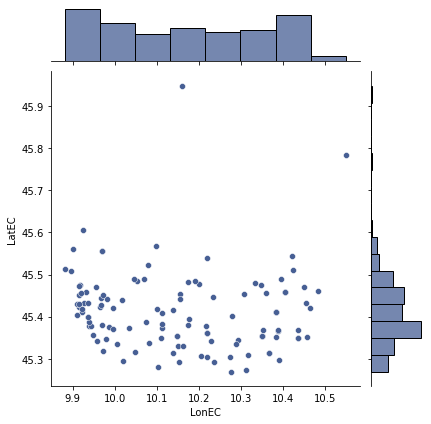

In [79]:
sns.jointplot(x='LonEC', y='LatEC', color="xkcd:dusky blue", data=geo_allevamenti)

Let's identify the farm that produces the most ammonia

In [80]:
most_ammonia = geo_allevamenti[geo_allevamenti['Ammoniaca'] == max(geo_allevamenti['Ammoniaca'])]
most_ammonia

,index,SORT..POSTUPDATE,ID.POSTUPDATE,ALLEVAMENTI,FORMA.GIURIDICA,REGIONE,PROVINCIA,COMUNE,LatEC,LonEC,RAGIONE.SOCIALE,Ammoniaca,geometry
45,246,246,215,14,SOCIETA' DI PERSONE,LOMBARDIA,Brescia,LENO,45.543611,10.422222,BOMPIERI ALLEVAMENTI S.S.,73.763,POINT (10.42222 45.54361)


In [81]:
# compute how much ammonia is produced in a year in the province of Brescia
total_ammonia = geo_allevamenti.Ammoniaca.sum()
total_ammonia

2782.663

During the 2020, in the province of Brescia the emission of ammonia is at least 2782.663 tonnes.

Let's consider again my municipality and see if there is an intensive farming.




In [82]:
mazzano_allevamenti = geo_allevamenti[geo_allevamenti['COMUNE'] == 'MAZZANO']
mazzano_allevamenti

,index,SORT..POSTUPDATE,ID.POSTUPDATE,ALLEVAMENTI,FORMA.GIURIDICA,REGIONE,PROVINCIA,COMUNE,LatEC,LonEC,RAGIONE.SOCIALE,Ammoniaca,geometry
53,349,349,295,1,SOCIETA' DI PERSONE,LOMBARDIA,Brescia,MAZZANO,45.475,10.348611,GALLINA GROUP S.S. SOCIETÀ AGRICOLA,37.32,POINT (10.34861 45.47500)


We can try to understand if this intensive farming is near Villa Mazzucchelli: using Street Network Analysis, let's find the shortest phat between these two points.

In [83]:
# let's save the two points
point_villa_mazzucchelli = (45.49356, 10.3434)
point_allevamento_mazzano = (45.475, 10.348611)


In [84]:
# download the data for pyrosm
url_dowload_mazzano_pbf = "https://osmit-estratti-test.wmcloud.org/dati/poly/comuni/pbf/017107_Mazzano_poly.osm.pbf"
urllib.request.urlretrieve(url_dowload_mazzano_pbf ,"mazzano_osm.pbf")

('mazzano_osm.pbf', <http.client.HTTPMessage at 0x238c64914b0>)

In [85]:
osm = pyrosm.OSM("mazzano_osm.pbf")

In [86]:
#create streets walking graph
nodes, edges = osm.get_network(network_type="walking", nodes=True)

In [87]:
network_onx = osm.to_graph(nodes, edges, graph_type="networkx")

In [88]:
point_nearest_villa = ox.distance.nearest_nodes(network_onx,Y=point_villa_mazzucchelli[0],
                                                X=point_villa_mazzucchelli[1])
point_nearest_allevamento = ox.distance.nearest_nodes(network_onx,Y=point_allevamento_mazzano[0],
                                                      X=point_allevamento_mazzano[1])

In [89]:
# calculate the shortest path 
shortest_path = ox.shortest_path(network_onx, point_nearest_villa, point_nearest_allevamento, weight="length")
# calculate the fastest path
fastest_path = ox.shortest_path(network_onx, point_nearest_villa, point_nearest_allevamento, weight="travel_time")

Here we can see the shortest path (red) and the fastest path (blue).

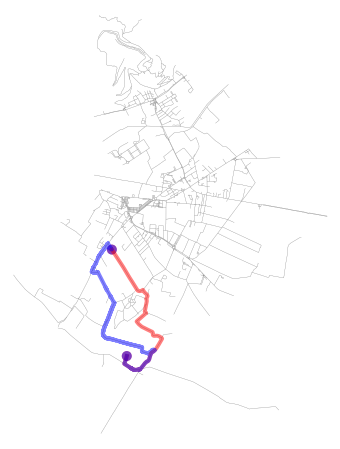

In [90]:
fig, ax = ox.plot_graph_routes(network_onx, routes= [shortest_path, fastest_path ], 
    route_colors=["r", "b"], 
    route_linewidth=6, bgcolor='w', 
    edge_linewidth=0.2 , node_size=0)

In [91]:
# Shortest phat 
lengths1 = ox.utils_graph.get_route_edge_attributes(network_onx, shortest_path, 'length')

# Fastest paht 
lengths2 = ox.utils_graph.get_route_edge_attributes(network_onx, fastest_path, 'length')

# the total length of the shortest path in km
path_length1 = sum(lengths1)
print("The shortest path between Villa Mazzucchelli and the only farm of Mazzano is", round(path_length1/1000, 2) , "km")

# the total length of the fastest path 
path_length2 = sum(lengths2)
print("The fastest path between Villa Mazzucchelli and the only farm of Mazzano is", round(path_length2/1000, 2),"km ")


The shortest path between Villa Mazzucchelli and the only farm of Mazzano is 3.62 km
The fastest path between Villa Mazzucchelli and the only farm of Mazzano is 4.31 km 


We discovered that an intensive farm is located only 3.62 km from Villa Mazzucchelli, it is quite close to my house and it produces a lot of ammonia every year (about 37 tonnes during 2020, not exactly good news!)

## Spatial Analysis
Let's creating a new GeoDataFrame that holds the data needed for the spatial analysis.  
We investigate the annual level of PM2.5 in order to make a not too long analysis, but in future research it would be interesting to  study this phenomenon monthly.

In [92]:
brescia_municipalities_epsg4326 = brescia_municipalities.to_crs("epsg:4326")


In [93]:
#firstly create a subset of geo_brescia_pm keeping only these variable: COMUNE, geometry and the average of PM2.5 
subset1 = geo_brescia_pm.groupby("COMUNE",  as_index=False)["Particelle.sospese.PM2.5...µg.m."].mean()
subset_pm25 = pd.merge(subset1, brescia_municipalities_epsg4326[["COMUNE", "geometry"]], on = 'COMUNE', how = 'left')
subset_pm25.head(3)

,COMUNE,Particelle.sospese.PM2.5...µg.m.,geometry
0,Acquafredda,19.520912,"MULTIPOLYGON (((10.42194 45.32382, 10.42178 45..."
1,Adro,17.907165,"MULTIPOLYGON (((9.97649 45.64267, 9.97613 45.6..."
2,Agnosine,13.895887,"MULTIPOLYGON (((10.36626 45.65956, 10.36662 45..."


In [95]:
#create a subset of geo_allevamenti keeping only these variable: RAGIONE.SOCIALE, COMUNE, Ammoniaca, ALLEVAMENTI, geometr
subset_allevamenti = geo_allevamenti[["RAGIONE.SOCIALE","COMUNE", "ALLEVAMENTI", "Ammoniaca"]]
subset_allevamenti.head(2)

,RAGIONE.SOCIALE,COMUNE,ALLEVAMENTI,Ammoniaca
0,SOCIETÀ AGRICOLA FERRARI E ARDESI S.S.,GAMBARA,1,11.920
1,"ALLEVAMENTO GAGGIA DI ROTA PIETRO,DARIO E STEF...",VEROLANUOVA,1,16.574


We have these two subsets and we can create the dataframe for the spatial analysis.
We are going to study te level of PM2.5 (Particelle.sospese.PM2.5...µg.m.) as function of number of farms (ALLEVAMENTI) and level of ammonia emissions (Ammoniaca)

In [96]:
#we had to modify the variable COMUNE because merge is case sensitive
subset_allevamenti["COMUNE"] = subset_allevamenti["COMUNE"].str.title()

C:\Users\elima\AppData\Local\Temp\ipykernel_33244\668267849.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset_allevamenti["COMUNE"] = subset_allevamenti["COMUNE"].str.title()


In [97]:
df_analysis = pd.merge(subset_allevamenti, subset_pm25, on = "COMUNE", how = 'right' )
df_analysis.head(3)

,RAGIONE.SOCIALE,COMUNE,ALLEVAMENTI,Ammoniaca,Particelle.sospese.PM2.5...µg.m.,geometry
0,SOCIETÀ AGRICOLA GATTA FAUSTINO E GIUSEPPE S.S.,Acquafredda,1.0,10.034,19.520912,"MULTIPOLYGON (((10.42194 45.32382, 10.42178 45..."
1,NaN,Adro,NaN,NaN,17.907165,"MULTIPOLYGON (((9.97649 45.64267, 9.97613 45.6..."
2,NaN,Agnosine,NaN,NaN,13.895887,"MULTIPOLYGON (((10.36626 45.65956, 10.36662 45..."


There are some NaN because in some municipalities there are no intensive farming.

In [98]:
df_analysis = gpd.GeoDataFrame(df_analysis, crs="EPSG:4326")

Save the file in shapefile format in order to be read by R

In [99]:
df_analysis.to_file('data_analysis.shp', driver='ESRI Shapefile')

C:\Users\elima\AppData\Local\Temp\ipykernel_33244\1751506031.py:1: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  df_analysis.to_file('data_analysis.shp', driver='ESRI Shapefile')


The analysis can be found in the file Project_analysis.Rmd 